In [2]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = 'DejaVu Serif'
plt.rcParams["mathtext.fontset"] = 'dejavuserif'
# make plots have a dark theme
plt.style.use('dark_background')

import glob
from astropy.io import fits
from astropy.table import Table, vstack
from astropy import units as u
from astropy.coordinates import SkyCoord
from scipy.spatial import cKDTree
from astropy.cosmology import LambdaCDM, z_at_value
cosmo = LambdaCDM(H0=69.6, Om0=0.286, Ode0=0.714)
h = 69.6/100

from alignment_functions.clusters import *
from geometry_functions.coordinate_functions import *
from visualization_functions import *
from alignment_functions.general_stats import *
from collections import defaultdict

scratch_path = '/pscratch/sd/c/clamman/'

In [ ]:
from matplotlib.widgets import Slider
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML

In [3]:
hod_mock = Table.read(scratch_path+'abacus/hod_catalogs/hod_catalog_ph000_z0.5000.fits')

In [57]:
def test_trim(catalog, box_size=100):
    xmin = -box_size/2; xmax = box_size/2
    ymin = -box_size/2; ymax = box_size/2
    zmin = -box_size/2; zmax = box_size/2
    return catalog[(catalog['x'] > xmin) & (catalog['x'] < xmax) & (catalog['y'] > ymin) & (catalog['y'] < ymax) & (catalog['z'] > zmin) & (catalog['z'] < zmax)]

hod_mock_trimmed = test_trim(hod_mock, 200)
abacus_points = np.vstack((hod_mock_trimmed['x'], hod_mock_trimmed['y'], hod_mock_trimmed['z'])).transpose()

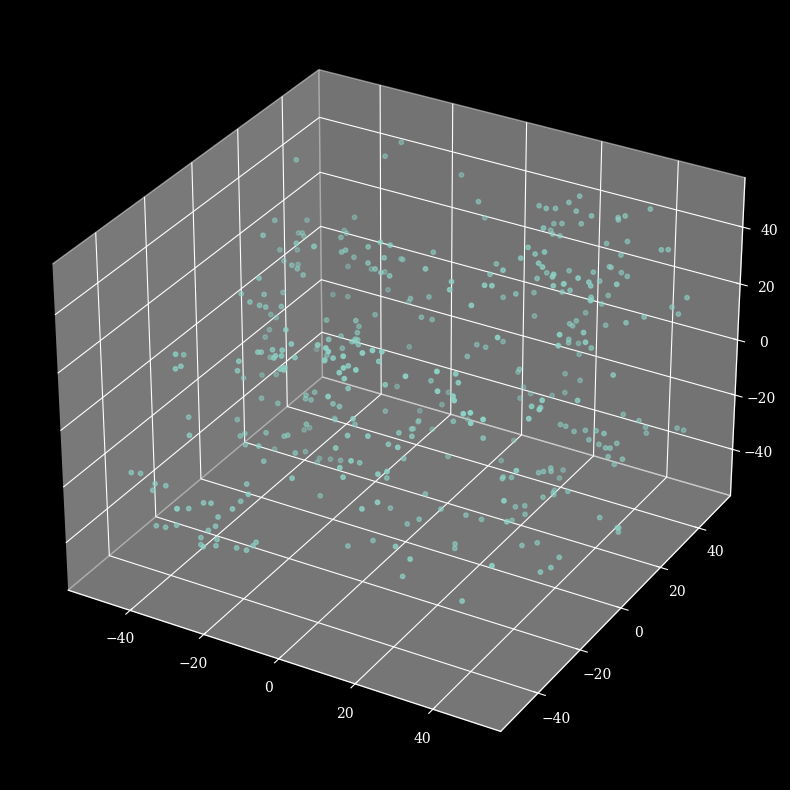

In [49]:
# plot points
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(abacus_points[:,0], abacus_points[:,1], abacus_points[:,2], s=10)

In [58]:
# find nearest neighbor for each galaxy
sep_max = 5
points = abacus_points

tree = cKDTree(points)
dd, ii = tree.query(points, distance_upper_bound=sep_max, k=2) 

# remove rows where there are no neighbors
no_neighbors = (ii[:,1] == len(points))
ii = ii[~no_neighbors]
dd = dd[~no_neighbors]
    

In [51]:
# functions to find clusters
class Node:
    def __init__(self, key):
        self.key = key
        self.parent = self
        self.size = 1

class UnionFind(dict):
    def find(self, key):
        node = self.get(key, None)
        if node is None:
            node = self[key] = Node(key)
        else:
            while node.parent != node: 
                # walk up & perform path compression
                node.parent, node = node.parent.parent, node.parent
        return node

    def union(self, key_a, key_b):
        node_a = self.find(key_a)
        node_b = self.find(key_b)
        if node_a != node_b:  # disjoint? -> join!
            if node_a.size < node_b.size:
                node_a.parent = node_b
                node_b.size += node_a.size
            else:
                node_b.parent = node_a
                node_a.size += node_b.size
                
def find_components(line_iterator, max_size):
    forest = UnionFind()

    for line in line_iterator:
        forest.union(*line.split())

    result = defaultdict(list)
    for key in forest.keys():
        root = forest.find(key)
        if root.size <= max_size:
            result[root.key].append(int(float(key)))  # Convert key to float and then to int

    # return list of integers
    return list(result.values())

In [44]:
cluster_results = find_components([' '.join(map(str, row)) for row in ii], 10)

In [45]:
# remove clusters that have another cluster within cluster_sep_min
def remove_close_clusters(cluster_result, cluster_sep_min=10):
    # find the center coordinates of each cluster
    cluster_centers = np.array([np.mean(points[cluster], axis=0) for cluster in cluster_result])
    
    # build the cluster tree
    cluster_tree = cKDTree(cluster_centers)
    
    # find all neighbors within cluster_sep_min for each cluster
    neighbors = cluster_tree.query_ball_tree(cluster_tree, cluster_sep_min)
    
    # remove clusters that have another cluster within cluster_sep_min
    filtered_result = [cluster_result[i] for i in range(len(cluster_result)) if len(neighbors[i]) == 1]
    
    return filtered_result

In [46]:
isolated_clusters = remove_close_clusters(cluster_results, 5)

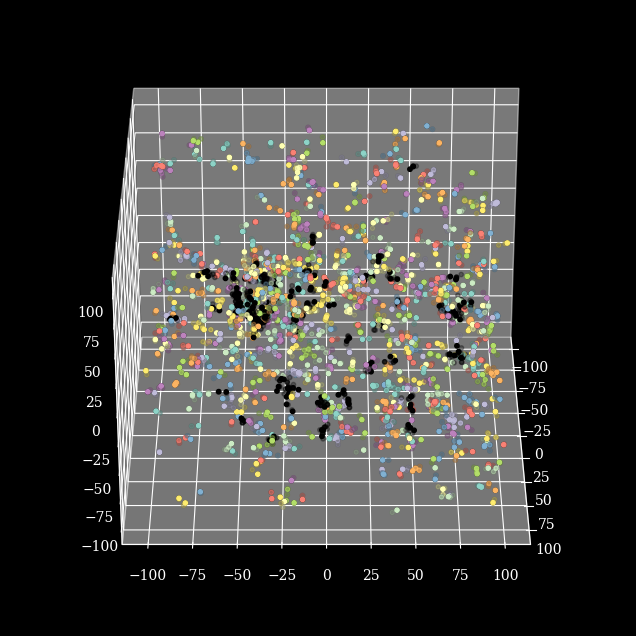

In [47]:
# plot the points with each cluster a different color
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
for cl in cluster_results:
    ax.scatter(points[cl][:,0], points[cl][0:,1], points[cl][0:,2], s=10, color='black')
    
for cl in isolated_clusters:
    ax.scatter(points[cl][:,0], points[cl][0:,1], points[cl][0:,2], s=10)

# make rotatable
def update_plot(i):
    ax.view_init(30, i)
    return fig,

ani = animation.FuncAnimation(fig, update_plot, np.linspace(0, 360, 30), interval=50)
# show ani in jupyter notebook

HTML(ani.to_jshtml())


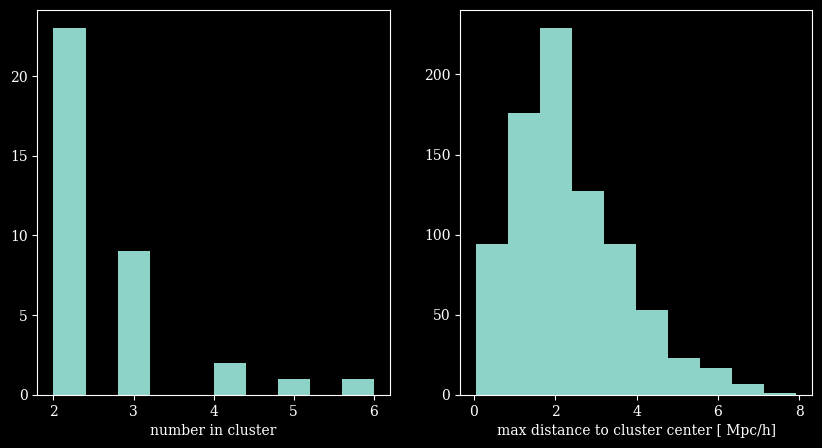

In [59]:
# look at cluster demographics
fig = plt.figure(figsize=(10,5))

plt.subplot(121)
plt.hist([len(cl) for cl in results])
plt.xlabel('number in cluster')

plt.subplot(122)
plt.xlabel('max distance to cluster center [ Mpc/h]')
# find the maximum distance between cluster members
cluster_distances = []
for cl in isolated_clusters:
    cluster_center = np.mean(points[cl], axis=0)
    distance_to_center = np.linalg.norm(points[cl] - cluster_center, axis=1)
    cluster_distances.append(np.max(distance_to_center))
plt.hist(cluster_distances);